<a href="https://colab.research.google.com/github/FatimaJahara/T2IPublicModels/blob/main/Stable_Diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install diffusers==0.18.0
!pip install transformers scipy ftfy
!pip install "ipywidgets>=7,<8"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 68.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 107.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.7 MB/s eta 0:00:00


In [ ]:
import torch

In [ ]:
from diffusers import StableDiffusionPipeline

# model_id = "runwayml/stable-diffusion-v1-5"
model_id = "stabilityai/stable-diffusion-2-1"

pipe = StableDiffusionPipeline.from_pretrained(model_id)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


In [ ]:
pipe = pipe.to("cuda")

In [ ]:
generator = torch.Generator("cuda").manual_seed(0)

In [ ]:
prompt = "portrait photo of a old warrior chief"

  0%|          | 0/50 [00:00<?, ?it/s]

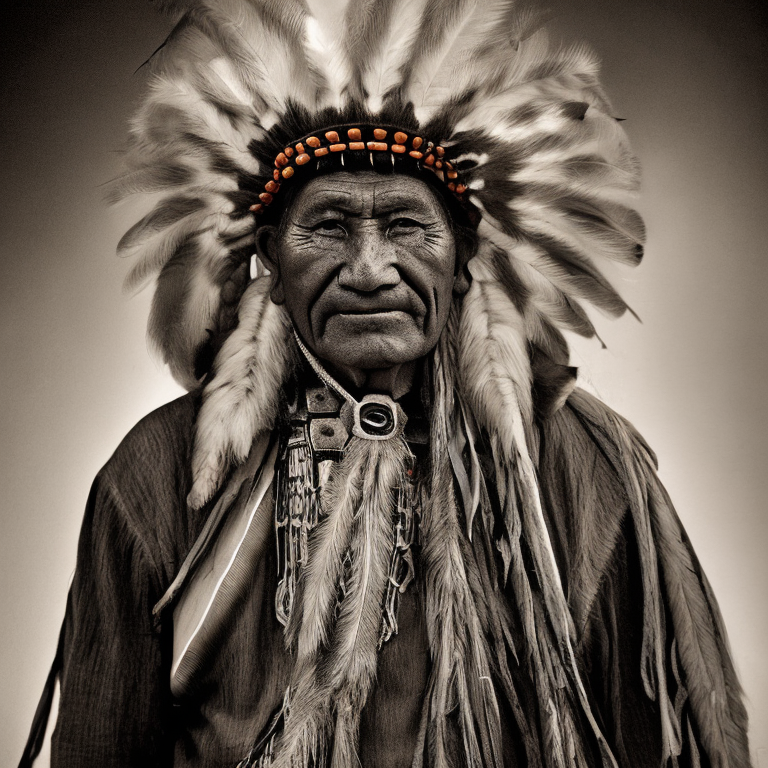

In [ ]:
image = pipe(prompt, generator=generator).images[0]
image

https://huggingface.co/docs/diffusers/v0.14.0/stable_diffusion

In [ ]:
from PIL import Image

def image_grid(imgs, rows=2, cols=2):
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
def get_inputs(batch_size=1):
  generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
  prompts = batch_size * [prompt]
  num_inference_steps = 20

  return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

  0%|          | 0/20 [00:00<?, ?it/s]

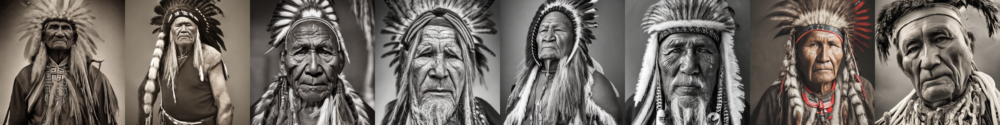

In [ ]:
images = pipe(**get_inputs(batch_size=8)).images
image_grid(images, rows=1, cols=8)